#**Exploratory Data Analysis on Building Permit Database in San Francisco**


In this notebook, building permit database of San Francisco has been analyzed and neccessary information has been visualized. 

**1- Features to be considered in machine learning model**

	Numerical columns: 
       ['Permit Type', 'Proposed Units', 'Duration_construction_days',
       'Number of Proposed Stories', 'Year', 'Proposed Construction Type',
       'total_area_m2', 'Supervisor District', 'Zipcode']

	Categorical columns: 
       ['Number of Proposed Stories_cat',
       'Proposed Construction Type Description',
       'Proposed Use']

**2- Revised cost versus initial estimated cost**

Revised project cost of residential buildings up to 15 stories is, in average, 16.2% greater than the initial estimated cost. The correlation is obtained between revised cost and estimated cost (R2 = 0.91) in the followings:

       Revised Project Cost = 1.16204 * Estimated Project Cost (in 2022's value of $)

**3- Median construction cost in the last decade in San Francisco**

Median construction cost of residential projects up to 15 stories in the last decade in San Francisco:

       2682 dollars (in 2022's value) per square meter

       249 dollars (in 2022's value) per square feet

**4- Summary of database filtering strategy**

Following masks have been applied on the original database from SFdata.gov:

*Taking new construction projects that were completed*
* permit_type_mask = dataset["Permit Type"] < 3 
* permit_complete_mask = dataset["Current Status"] == "complete" #completed projects

*Taking residential projects*
* m_pu1 = dataset["Proposed Use"]=="1 family dwelling" 
* m_pu2 = dataset["Proposed Use"]=="2 family dwelling"
* m_pu3 = dataset["Proposed Use"]=="apartments"

*Taking central 98% of data with respect to estimated cost distribution*
* m_out0 = dataset['Est_Cost_Infl_log10'] <= dataset['Est_Cost_Infl_log10'].quantile(0.99)
* m_out1 = dataset['Est_Cost_Infl_log10'] >= dataset['Est_Cost_Infl_log10'].quantile(0.01)

*Taking central 98% of data with respect to number of proposed unit distribution*
* m_out2 = dataset['Proposed Units'] <= dataset['Proposed Units'].quantile(0.99)
* m_out3 = dataset['Proposed Units'] > dataset['Proposed Units'].quantile(0.01)

*Taking buildings with no more than 15 stories*
* m_out4 = dataset['Number of Proposed Stories_'] <= 15

In [1]:
#*LOADING LIBRARIES AND BUILDING PERMIT DATABASE*
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

import seaborn as sns #using it for heatmap and static figs

from scipy import stats
from scipy.stats import norm, skew #using it for skewness of distributions

In [2]:
db_v4 = 'https://drive.google.com/file/d/19ERs5bmAdxEfgUmTxgfIBhUoT6xPHzZy/view?usp=sharing' #refined dataset for new constructions
db_v8 = 'https://drive.google.com/file/d/1Ffbhy12m4JG9REEdSQwwewIFE0KUiEX3/view?usp=sharing' #dataset without outliers and new features added

#let's load the version 4 with all data
fname1 = db_v4
fname1='https://drive.google.com/uc?id=' + fname1.split('/')[-2]
fname1 = '/home/leo/Downloads/Building_Permits_v4.csv'
dataset = pd.read_csv(fname1, low_memory=False)

#let's load the final version of database after outliers removed and with area per m2
fname2 = db_v8 
fname2='https://drive.google.com/uc?id=' + fname2.split('/')[-2]
fname2 = '/home/leo/Downloads/Building_Permits_v8.csv'
dataset_v8 = pd.read_csv(fname2, low_memory=False)


In [3]:
dataset.shape

(9408, 42)

In [4]:
dataset.columns

Index(['Permit Number', 'Permit Type', 'Permit Type Definition',
       'Permit Creation Date', 'Block', 'Lot', 'Street Number', 'Street Name',
       'Street Suffix', 'Description', 'Current Status', 'Current Status Date',
       'Filed Date', 'Issued Date', 'Completed Date',
       'First Construction Document Date', 'Number of Proposed Stories',
       'Permit Expiration Date', 'Estimated Cost', 'Revised Cost',
       'Proposed Use', 'Proposed Units', 'Plansets',
       'Proposed Construction Type', 'Proposed Construction Type Description',
       'Site Permit', 'Supervisor District',
       'Neighborhoods - Analysis Boundaries', 'Zipcode', 'Location',
       'Record ID', 'address', 'lat', 'lon', 'Duration_construction_days',
       'Process_time_days', 'Year', 'Est_Cost_Infl', 'Rev_Cost_Infl',
       'Est_Cost_Infl_log10', 'Est_Cost_Infl_loge', 'lat_lon'],
      dtype='object')

#Columns in dataset

**Adress-related columns:**

       'Block', 'Lot', 'Street Number', 'Street Name',
       'Street Suffix', 'Neighborhoods - Analysis Boundaries', 'Zipcode,
       'Location',

       Added columns: 
       'address', 'lat', 'lon', 'lat_lon'

**Time-related columns:**

       'Current Status Date'
       'Filed Date', 'Issued Date', 'Completed Date',
       'First Construction Document Date', 
       'Permit Expiration Date', 

        Added columns:
       'Duration_construction_days',
       'Process_time_days'

**Building type related columns:**

       'Permit Type', 'Permit Type Definition',
       'Description', 'Current Status',
       'Number of Proposed Stories',
       'Proposed Use', 'Proposed Units', 'Plansets',
       'Proposed Construction Type', 'Proposed Construction Type Description', 

**Cost related columns:**

       'Estimated Cost', 'Revised Cost',

       Added columns:
       'Est_Cost_Infl', 'Rev_Cost_Infl',
       'Est_Cost_Infl_log10', 'Est_Cost_Infl_loge'

**SF ID-related columns:**

       'Permit Number', 
       'Site Permit', 'Supervisor District',
       'Record ID',

#Columns related to Dates and Duration

In the followings, we will convert Date columns to Datetime. It will be useful to avoid problems with our visualizations.

In [5]:
#selecting columns related to date
date_cols = [col for col in dataset.columns if 'date' in col.lower()]

*Let's check the earliest and latest dates ...*

In [6]:
for col in date_cols:
    dataset.loc[:,col] = pd.to_datetime(dataset[col], errors = 'coerce')
    print('Col :',col, ' Min= ', dataset.loc[:,col].min(), 'Max= ', dataset.loc[:,col].max())
    #we used errors = coerce, as there are some values/outliers out of the bound     

Col : Permit Creation Date  Min=  1977-10-19 00:00:00 Max=  2020-08-18 00:00:00
Col : Current Status Date  Min=  1982-01-25 00:00:00 Max=  2022-08-03 00:00:00
Col : Filed Date  Min=  1977-10-19 00:00:00 Max=  2020-08-18 00:00:00
Col : Issued Date  Min=  1978-06-13 00:00:00 Max=  2021-02-17 00:00:00
Col : Completed Date  Min=  1982-01-25 00:00:00 Max=  2022-08-03 00:00:00
Col : First Construction Document Date  Min=  1989-03-27 00:00:00 Max=  2022-06-16 00:00:00
Col : Permit Expiration Date  Min=  1980-10-29 00:00:00 Max=  2025-10-19 00:00:00


Here what we observe:

*   Permit creation records include data from 1977 to 2020.
*   Completed dates range from 1982 to 2022.



The figure by SF shows the stages of building permit:

![SFPlanning.org](data:image/png;base64,)
[ref-SFPlanning.org](https://sfplanning.org/project/pipeline-report#about)

It shows that

* Filed Dates represent the date when the city of San Francisco receives the building permit demand from the companies and indivuals.

* Issued Dates represent the date when the city of San Francisco makes a response whether the building permit is accepted or not. 

We use Completed Date and Issued Date to estimate duration of construction.

We use Permit Creation Date to fill Year column. Year column will be then used to integrate inflation rate of USD dollar in our cost data.

▶ **Let's investigate the distribution of Duration and Year columns further.**

In [7]:
def cat_stories (st): 
    """
    We create a column with categories of number of proposed stories
    """
    if st < 3 :
      y = '0-2 stories'
    elif st< 5 :
      y = '3-4 stories'
    elif st < 8 :
      y = '5-7 stories'
    elif st < 10 :
      y = '8-9 stories'
    else:
      y = 'More than 10 stories'
    return y

col_ ='Number of Proposed Stories'
dataset[col_].value_counts()
dataset[col_+'_cat'] = dataset[col_].apply(lambda x: cat_stories(x)).astype(str)

#We create a column of construction duration in years 
dataset['Duration_construction_years'] = dataset['Duration_construction_days']/365

print("\nHere is the amount of data in each category\n")
dataset['Number of Proposed Stories_cat'].value_counts()


Here is the amount of data in each category



3-4 stories             5001
0-2 stories             3458
More than 10 stories     462
5-7 stories              365
8-9 stories              122
Name: Number of Proposed Stories_cat, dtype: int64

**Let's analyze the number of constructions completed by year** 

In [8]:
fig = px.histogram (dataset.sort_values(by= 'Number of Proposed Stories_cat'), x='Completed Date',
                   title='Histogram of Completed Buildings in San Francisco',
                   opacity=0.8,
                   color='Number of Proposed Stories_cat',
                   hover_data=['Number of Proposed Stories_cat']
                   )
fig.update_xaxes(rangeslider_visible=True,
                rangeselector=dict(
            buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(count=10, label="10y", step="year", stepmode="backward"),
            dict(count=20, label="20y", step="year", stepmode="backward"),
            dict(count=30, label="30y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.show()

**Results:**

We observe that
1.   City of San Francisco experienced an more active construction market up until early 90s.

2.   Since 2004, there has been fewer new construction projects in San Francisco. Possible reasons may be the recessions of 2001 and 2007 in the US economy, the lack of available spaces and urban planning ideas. 

**Discussion:**

High-rise buildings (10+ stories) had been mostly built before '90s. Number of high rise projects has been limited since then. It may be explained by the impact of the big San Francisco earthquake in 1989. It might have demotivated the construction of tall buildings. Some high-rise buildings have been built since 2008, probably with the presence of giant tech companies present in the region.

More information on SF contruction trends can be found on the following report: [ https://sfplanning.org/project/san-francisco-housing-needs-and-trends-report ]

**Idea(s):**

Can we predict the trend of construction market in the near future in San Francisco? This could be a subject of a further study.


In [9]:
#Graph - Construction Duration Histogram

fig = px.histogram (dataset.sort_values(by = 'Number of Proposed Stories_cat'), x='Duration_construction_years',
                   title='Histogram of Construction Durations in San Francisco',
                   opacity=0.8,
                   marginal="box", 
                   color= 'Number of Proposed Stories_cat',
                   hover_data=dataset.columns,
                   range_x=[0, 10]
                   )

fig.update_xaxes(rangeslider_visible=False, title = 'Duration of construction in years')
fig.show()

**Results:**

We observe that
1.   Most of the constructed buildings have 0 - 4 stories.
2.   To build 0-2 stories take approximately between *0.5 and 1.5 years*.  
3.   To build 3-4 stories take approximately between *1.0 and 2.0 years*. 
4.   To build 5-7 stories take approximately between *1.5 and 3.5 years*.
5.   To build 8-9 stories take approximately between *2.0 and 4.0 years*.
5.   To build high-rise buildings take approximately between *1.0 and 3.5 years*.

**Discussion:**

For some projects, the construction delay is greater than the central values above. Construction companies may have chosen to start their projects years after their permit being issued. It is also possible that unexpected delays can be due to late material delivery, financial problems, natural disasters like earthquakes, etc. In general, taller buildings take longer to construct than buildings with fewer stories. Please note that the amount of data in each category is not same.


#Columns related to Location

In [10]:
#Let's show construction projects in an interactive map
dataset['Estimated cost in today s dollars in log10']=dataset['Est_Cost_Infl_log10'].astype(int)

lat0 , lon0 = 37.750000, -122.431000 #zoom coordinates of map
fig = px.scatter_mapbox(dataset, lat="lon", lon="lat",
                        zoom = 11.0, center = {'lat': lat0, 'lon': lon0}, 
                        mapbox_style="stamen-toner", color='Estimated cost in today s dollars in log10',
                        title = 'Locations of buildings constructed in San Francisco since early 80s ',                 
              )

fig.show()



*   Buildings in downtown and financial district area are composed of mostly high rise buildings, which may explain the high cost of the projects in the central areas .

**Let's show the data grouped by neighborhoods.**



In [11]:
#Let's create a new dataframe representing characteristic values of each neighborhood
neigh_ = 'Neighborhoods - Analysis Boundaries'

#First, we need to create few other columns for the readability
dataset['Cost_1M'] = dataset['Est_Cost_Infl']/1000000 # estimated cost in today's 1M dollar
dataset['Completed Year'] = dataset['Completed Date'].dt.year #year of project completion

#Let's provide following informations on map : 
cols_ = ['Cost_1M','Completed Year','Number of Proposed Stories']

#taking averages by neighborhood:
table_locn = (dataset.groupby(neigh_)[cols_]).median() 

#note that coordinates of neighborhoods are obtained by mean lat and lon
table_locn [['lat','lon']]= (dataset.groupby(neigh_)['lat','lon']).mean() 

#keeping total project counts:
table_locn ['count'] =  dataset.groupby(neigh_).count().iloc[:,0]

#seperate column with neigborhood names and removing 'other' column
table_locn['Neighborhoods']=table_locn.index
m1 = table_locn['Neighborhoods'] != 'Other'
table_locn= table_locn.loc [m1,:]

#reseting index. it is neccessary to be able to see hover information
table_locn = table_locn.reset_index(drop=True)

#changing column names for readability
table_locn.columns = ['Median cost in 1M$', 'Median completed year', 'Median story number', 
                      'lat', 'lon', 'Total counts', 'Neighborhoods']

#rounding float numbers for readability of values
cols_num = ['Median cost in 1M$', 'Median completed year', 'Median story number']
table_locn [cols_num] = table_locn [cols_num].round(2)

/tmp/ipykernel_49303/3770988909.py:15: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [12]:
lat0 , lon0 = 37.750000, -122.431000
fig = px.scatter_mapbox(table_locn, lat="lon", lon="lat",
                        zoom = 11.0, center = {'lat': lat0, 'lon': lon0}, 
                        mapbox_style="carto-positron", color='Total counts',
                        size= 'Median cost in 1M$',size_max = 70,
                        title = 'New buildings constructed in San Francisco since early 80s by log cost ',
                        hover_name = 'Neighborhoods',
                        hover_data = {'Total counts': True,
                                      'Median cost in 1M$':True,
                                      'Median completed year':True,
                                      'Median story number':True,
                                      'lon' : False,
                                      'lat' : False,
                                      'Neighborhoods': False}
                       )

fig.update_layout( hovermode="closest")
fig.show()

**Results:**

We observe that

1.   High rise buildings took mostly in the vicinity of downtown San Francisco (Financial D/South B, Tenderloin, Mission Bay, Chinatown and South of Market). So, we also observe that most expensive and the tallest construction projects  mostly took place in the vicinity of downtown SF.  

2.   Housing projects with fewer stories took place away from the city center. 

3.   Most of the  new construction projects took place in Bayview Hunters Point. Also, the regions like Mission, Portero Hill and Outer Richmond had active construction efforts. These neighborhoods are located a bit away from the city center. It is likely that it provided more affordable housing at those years.


**Idea(s):**

🥽 *Let's find top five neigborhoods with most expensive construction projects and most construction project projects*

In [13]:
print('\nTop 5 neighborhoods with highest median construction cost')
table_locn.sort_values(by = 'Median cost in 1M$',ascending = False).iloc[:,[-1,0,-2]].head(5)


Top 5 neighborhoods with highest median construction cost


,Neighborhoods,Median cost in 1M$,Total counts
30,Tenderloin,27.24,57
5,Financial District/South Beach,17.56,180
15,Mission Bay,13.66,118
3,Chinatown,6.92,34
18,North Beach,3.80,115


In [14]:
print('\nTop 5 neighborhoods with most construction projects since 1980s\n')
table_locn.sort_values(by = 'Total counts',ascending = False).iloc[:,[-1,-2]].head(5)


Top 5 neighborhoods with most construction projects since 1980s



,Neighborhoods,Total counts
0,Bayview Hunters Point,1543
14,Mission,490
24,Potrero Hill,454
21,Outer Richmond,420
28,South of Market,320


#Columns related to Cost

In [15]:
print('\nMedian cost of construction projects in million $ by number of stories')
dataset.loc[:,['Number of Proposed Stories_cat','Est_Cost_Infl']].groupby(by='Number of Proposed Stories_cat').median()/1000000.


Median cost of construction projects in million $ by number of stories


,Est_Cost_Infl
Number of Proposed Stories_cat,
0-2 stories,0.349639
3-4 stories,0.621966
5-7 stories,10.805552
8-9 stories,20.093476
More than 10 stories,2.607665


In [16]:
print('\nMedian cost of construction projects by permit type')
print("""
    Type 1: 'New Construction (Reinforced concrete, Steel, etc...)' Type 2: 'New Construction Wood Frame'
    """)
dataset.loc[:,['Permit Type','Est_Cost_Infl']].groupby(by='Permit Type').median()/1000000.



Median cost of construction projects by permit type

    Type 1: 'New Construction (Reinforced concrete, Steel, etc...)' Type 2: 'New Construction Wood Frame'
    


,Est_Cost_Infl
Permit Type,
1,8.356686
2,0.498718


In [17]:
print('\nMedian cost of construction projects by construction type')
print("""
    Type 1: 'Ordinary', Type 2: 'Fire resistive', Type 3: 'Combustible', Type 4: 'Heavy Timber', 
    Type 5: 'Wood-framed', Type 99: 'Other'
""")
dataset.loc[:,['Proposed Construction Type','Est_Cost_Infl']].groupby(by='Proposed Construction Type').median()/1000000.



Median cost of construction projects by construction type

    Type 1: 'Ordinary', Type 2: 'Fire resistive', Type 3: 'Combustible', Type 4: 'Heavy Timber', 
    Type 5: 'Wood-framed', Type 99: 'Other'



,Est_Cost_Infl
Proposed Construction Type,
1,22.185573
2,2.613749
3,1.134097
4,0.809373
5,0.495690
99,0.909791


In [18]:
print('\nMedian cost of construction projects by construction purposes\n')
table_pu = dataset.loc[:,['Proposed Use','Est_Cost_Infl']].groupby(by='Proposed Use')
table_pu = pd.concat([table_pu.count(), table_pu.median()/1000000.],axis=1)
table_pu.columns = ['Count','Median in 1 Million $']
table_pu.sort_values(by = 'Count',ascending= False).head(5)



Median cost of construction projects by construction purposes



,Count,Median in 1 Million $
Proposed Use,,
1 family dwelling,3140,0.316237
apartments,2606,1.268823
2 family dwelling,1916,0.550752
office,211,7.631004
artist live/work,201,1.066811


Results:

We observe that the following parameters have an impact on estimated project cost: 
   1- Number of stories built
   2- Permit type
   3- Construction type
   4- Proposed use

*  The cost of 5 and more story buildings is markedly greater. Please note that there is not sufficient data for building projects with more than 15 floors.

* Median cost of permit-type-2 projects (wood-framed structures) is much less than the median cost of the permit-type-1 projects (reinforced concrete, steel structures, etc.).

* The construction type of 'ordinary' shows the highest median cost. 

* Appartments cost much more than 1- and 2- family dwellings. Please note that there is not equivalent amount of data for each type of use.

**Conclusions**

1.   Let's keep number of stories, permit type, construction type and proposed use as a feature for our machine learning model.
2.   Seen the unequivalant data amount in categories, it would be a good idea to limit the machine learning prediction capabilities as a function of data present in categories. 

In the latest version (v8) of database, we consider 
    
      * Up to 15-story buildings and 
      * Use of 1-, 2-family dwellings and appartments
      * Some other masks that will be discussed later in this notebook




In [19]:
dataset_v8.shape

(6575, 62)

In [20]:
print("Let's take the version 8 of database with area per m2 column added and outliers cleaned.")
print("")
print("It includes appartments, 1-/2- family dwellings and appartments up to 15 floors as well as new features.")
print("\n\tShape of dataset v4: ", dataset.shape)
print("\n\tShape of dataset v8: ", dataset_v8.shape)

Let's take the version 8 of database with area per m2 column added and outliers cleaned.

It includes appartments, 1-/2- family dwellings and appartments up to 15 floors as well as new features.

	Shape of dataset v4:  (9408, 47)

	Shape of dataset v8:  (6575, 62)


#**Estimated cost versus revised cost**

In [21]:
print("Let's graph estimated cost versus revised cost in today's $\n")
print("Please note that it includes data for residential building projects up to 15 stories.\n")

Let's graph estimated cost versus revised cost in today's $

Please note that it includes data for residential building projects up to 15 stories.



In [22]:
fig = px.scatter(dataset_v8, y='Rev_Cost_Infl', x='Est_Cost_Infl',
                 trendline='ols',
                 trendline_options=dict(add_constant=False),
                 width=800,   # plot width
                 height=500, # plot height
                 range_x = [0,70e6],
                 range_y = [0,70e6])
fig.update_xaxes(title = "Estimated construction cost (2022 $)")
fig.update_yaxes(title = "Revised construction cost (2022 $)")
fig.show()

In [23]:
results = px.get_trendline_results(fig)
print(results)
print('\nSummary of regression results\n')
results.px_fit_results.iloc[0].summary()

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...

Summary of regression results



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.914
Model:                            OLS   Adj. R-squared (uncentered):              0.914
Method:                 Least Squares   F-statistic:                          3.807e+04
Date:                Tue, 06 Sep 2022   Prob (F-statistic):                        0.00
Time:                        16:05:23   Log-Likelihood:                         -57165.
No. Observations:                3562   AIC:                                  1.143e+05
Df Residuals:                    3561   BIC:                                  1.143e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.1620      0.006    195.125      0.000       1.150       1.174
==============================================================================
Omnibus:                     4985.622   Durbin-Watson:                   1.403
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1881729.307
Skew:                           7.998   Prob(JB):                         0.00
Kurtosis:                     114.458   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Results:**

We observe that project cost has been revised since the initial estimation at the time of building permit created. By using the plotly's trendline option (Ordinary Least Squares - 'ols'), we obtained a curve to correlate estimated cost with revised cost. R2 of the fitted line was noted as 0.91, which is sufficiently good.

*Note that the closer to 1.0 R2 is, the better the score is.*

The fitted line (R2 = 0.91) has the following form:

    Revised Project Cost = 1.16204 * Estimated Project Cost (in 2022's value of $)

**Conclusions**

Revised project cost of residential buildings up to 15 stories is, in average, 16.2% greater than the initial estimated cost.




#**Cost per total surface area of building**

In [24]:
print("Let's dive-in the distrubtion of estimated project cost per ft2\n")
m1 = dataset_v8['cost_per_m2'] >dataset_v8['cost_per_m2'].quantile(0.075) #masking 1
m2 = dataset_v8['cost_per_m2'] <dataset_v8['cost_per_m2'].quantile(0.925) #masking 2

#taking central 85% of data
cost_persurface_peryear = dataset_v8.loc[m1&m2,['cost_per_m2','Year']].groupby(by='Year') 
med_cost_persurface= cost_persurface_peryear.median()

rev_cost_ratio= 1.6204 #coefficient to obtain revised cost from estimated cost 
med_cost_persurface ['rev_cost_per_m2'] = med_cost_persurface ['cost_per_m2'] * rev_cost_ratio
med_cost_persurface ['rev_cost_per_ft2'] = med_cost_persurface ['rev_cost_per_m2']/10.764 #conversion to ft sq

med_cost_persurface['Year'] = med_cost_persurface.index
med_cost_persurface['Count'] = cost_persurface_peryear.count()

Let's dive-in the distrubtion of estimated project cost per ft2



In [25]:
med_cost_persurface.tail()

,cost_per_m2,rev_cost_per_m2,rev_cost_per_ft2,Year,Count
Year,,,,,
2015,1688.247596,2735.636405,254.146823,2015,120
2016,2114.756581,3426.751563,318.352988,2016,40
2017,2285.975610,3704.194878,344.128101,2017,11
2018,2124.318789,3442.246165,319.792472,2018,3
2019,2493.744864,4040.864177,375.405442,2019,2


In [26]:
fig = px.line (med_cost_persurface, 
               y='rev_cost_per_ft2', x='Year',
               markers=True,
               title = "Evolution of median construction cost per ft2 in San Francisco",
               hover_name="Year",
               hover_data={"Count": True, "Year":False},
               labels = { "rev_cost_per_ft2" : "Median construction cost per ft2 (2022 $)"}  # change legend title)
               )
fig.show()
print("It represents residential buildings up to 15 stories.\n")

It represents residential buildings up to 15 stories.



In [27]:
#Let's calculate median cost per surface in the last decade.
m3 = dataset_v8['Year'] >= 2010 #masking data since 2015 
med_cost_perm2 = dataset_v8.loc[m1&m2&m3,'cost_per_m2'].median()

rev_cost_ratio= 1.6204 #multiplier to obtain revised cost given estimated cost 
val_m2= med_cost_perm2 * rev_cost_ratio #median revised cost in m2
val_ft2 = val_m2/10.764 #conversion to ft sq - median revised cost in ft2

print(f'\nMedian construction cost of residential projects up to 15 stories in the last decade in San Francisco:')
print(f'\t{int(val_m2)} $ per square meter')
print(f'\t{int(val_ft2)} $ per square feet')


Median construction cost of residential projects up to 15 stories in the last decade in San Francisco:
	2682 $ per square meter
	249 $ per square feet


**Results and Discussion**

The median construction cost per square feet had been below 300$ for most of the years before 2005. It experienced a decreasing trend in 2011 and 2012. Since 2015, the project cost has been increasing. 

In a recent study by Terner Center at UC Berkeley, the average construction cost per square ft was reported as between 175 and 400 dollars for San Francisco Bay Area for the years between 2010 and 2018. Even though the cost per square ft, calculated herein, may not be directly comparable to that scholar work. But, seen the assumptions and the nature of the project herein, the data is roughly in line with that report. It can be considered as a sanity check.

Reference to Terner Center report: https://ternercenter.berkeley.edu/research-and-policy/hard-construction-costs-apartments-california/


In [28]:
#Graph - Histogram of estimated cost per square feet
rev_cost_ratio= 1.6204 #multiplier to obtain revised cost given estimated cost 

df1=dataset_v8.loc[m1&m2,['Number of Proposed Stories_cat','cost_per_m2']]
df1['rev_cost_per_m2'] = rev_cost_ratio * df1['cost_per_m2']  
df1['rev_cost_per_ft2'] = df1['rev_cost_per_m2'] /10.764 #conversion to ft sq 

def re_category(x):
    if (x == '5-7 stories') | (x == '8-9 stories') | (x == 'More than 10 stories') :
        y = '5 and more stories'
    else: 
        y =x 
    return y
        
df1['Number of Proposed Stories_cat_'] = df1['Number of Proposed Stories_cat'].apply(lambda x: re_category(x))


fig = px.histogram (df1.sort_values(by = 'Number of Proposed Stories_cat_'), x='rev_cost_per_ft2',
                   title='Histogram of Construction Cost per Square Feet in San Francisco',
                   opacity=0.8,
                   marginal="box", 
                   color= 'Number of Proposed Stories_cat_',
                   hover_data=df1.columns,
                   range_x=[0, 1250]
                   )

fig.update_xaxes(rangeslider_visible=False, title = 'Revised construction cost per square ft (2022 $)')
fig.show()

#***Let's explore heatmap***

In [29]:
print("We will use version 8 of database with area per m2 column added and outliers cleaned here.")
print("")
print("It includes appartments, 1-/2- family dwellings and appartments up to 15 floors.")
#dataset_v8

We will use version 8 of database with area per m2 column added and outliers cleaned here.

It includes appartments, 1-/2- family dwellings and appartments up to 15 floors.


<AxesSubplot:>

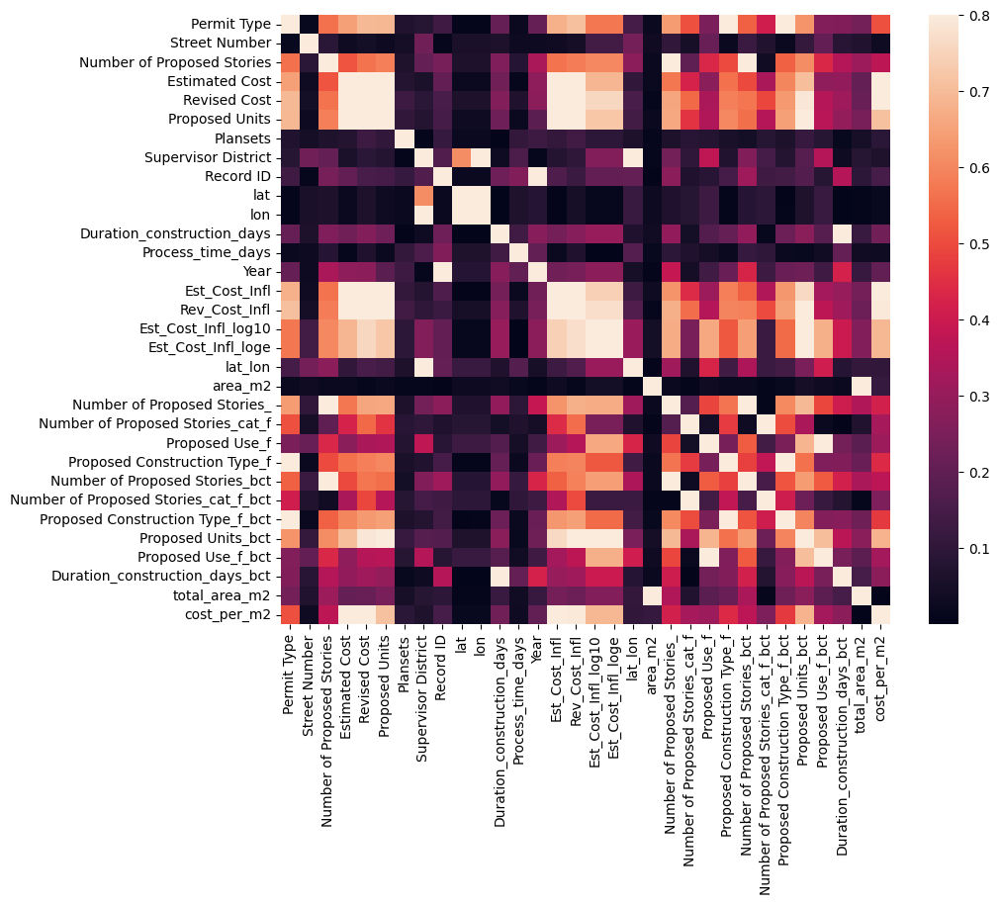

In [30]:
f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(dataset_v8.corr().abs(), vmax=.8, square=True)

**Results:**

We observe that estimated cost is in correlation with certain columns.

**Let's investigate these columns further as well as the categorical columns that were not present **

In [31]:
hcols_num = ['Permit Type',
       'Number of Proposed Stories',
       'Estimated Cost', 'Revised Cost',
       'Proposed Units', 'Plansets',
       'Proposed Construction Type', 
       'Supervisor District',
       'Location',
       'Duration_construction_days',
       'Year',
       'Est_Cost_Infl', 'Rev_Cost_Infl',
       'Est_Cost_Infl_log10',
       'lat','lon', 'lat_lon','Zipcode',
       'area_m2',
       'total_area_m2', 'cost_per_m2']
       
hcols_cat = ['Proposed Use', 
             'Proposed Construction Type Description',
             'Description', 
             'Permit Type Definition',
             'Neighborhoods - Analysis Boundaries', 'Zipcode',
             'Number of Proposed Stories_cat']

In [32]:
newdf = dataset_v8[hcols_num]
newdf_cat = dataset_v8[hcols_cat]

In [33]:
print("\n[Numeric columns] Features correlation with construction cost. The closer the value is to 1.0, the more the correlation is.\n")
newdf.corr().loc[:,['Est_Cost_Infl_log10','Est_Cost_Infl']].abs().sort_values(by='Est_Cost_Infl_log10',ascending=False)


[Numeric columns] Features correlation with construction cost. The closer the value is to 1.0, the more the correlation is.



,Est_Cost_Infl_log10,Est_Cost_Infl
Est_Cost_Infl_log10,1.000000,0.740890
Rev_Cost_Infl,0.773270,0.950794
Revised Cost,0.758476,0.960960
Est_Cost_Infl,0.740890,1.000000
Proposed Units,0.723331,0.873405
cost_per_m2,0.691061,0.808902
Estimated Cost,0.688520,0.979253
Number of Proposed Stories,0.602591,0.562830
Permit Type,0.573021,0.680219
lat_lon,0.309220,0.131046


In [34]:
#First, we apply pd.factorize to encode categorical variables.
newdf_cat = newdf_cat.apply(lambda x : pd.factorize(x)[0])

#Second, we include cost related columns in dataframe
newdf_cat[['Est_Cost_Infl', 'Est_Cost_Infl_log10']]= dataset [['Est_Cost_Infl', 'Est_Cost_Infl_log10']]

print("\n[Categorical columns] Driving parameters of construction cost. The closer the value is to 1.0, the more the correlation is.\n")
newdf_cat.corr().loc[:,['Est_Cost_Infl_log10','Est_Cost_Infl']].abs().sort_values(by='Est_Cost_Infl_log10',ascending=False)


[Categorical columns] Driving parameters of construction cost. The closer the value is to 1.0, the more the correlation is.



,Est_Cost_Infl_log10,Est_Cost_Infl
Est_Cost_Infl_log10,1.000000,0.491262
Est_Cost_Infl,0.491262,1.000000
Description,0.045383,0.017693
Proposed Construction Type Description,0.022617,0.008584
Proposed Use,0.013724,0.017045
Number of Proposed Stories_cat,0.012424,0.002804
Zipcode,0.007435,0.022741
Permit Type Definition,0.004513,0.006509
Neighborhoods - Analysis Boundaries,0.000464,0.033644


**Conclusions:**



1.  Here are the numeric columns to test in machine learning model: 

       'Permit Type',

       'Proposed Units', 
       
       'Duration_construction_days',
       
       'Number of Proposed Stories',
       
       'Year',
       
       'Proposed Construction Type',

       'total_area_m2'
       
       'Supervisor District', 
       
       'Zipcode', 


2.  Here are the categorical columns to test in machine learning model: 

       'Number of Proposed Stories_cat',

       'Proposed Construction Type Description',
       
       'Proposed Use'



**Let's see the distribution of these columns**

In [35]:
cols_num = ['Permit Type','Proposed Units',
            'Number of Proposed Stories', 'total_area_m2',
            'Proposed Construction Type','Supervisor District','Zipcode', 'lat_lon']

cols_cat = ['Number of Proposed Stories_cat', 'Proposed Construction Type Description',
            'Description','Proposed Use']

newdf_cat = dataset_v8[cols_cat]
newdf_cat = newdf_cat.apply(lambda x : pd.factorize(x)[0])
newdf_num = dataset_v8[cols_num]
newdf =  pd.concat([newdf_cat,newdf_num], axis=1)

In [36]:
newdf.shape

(6575, 12)

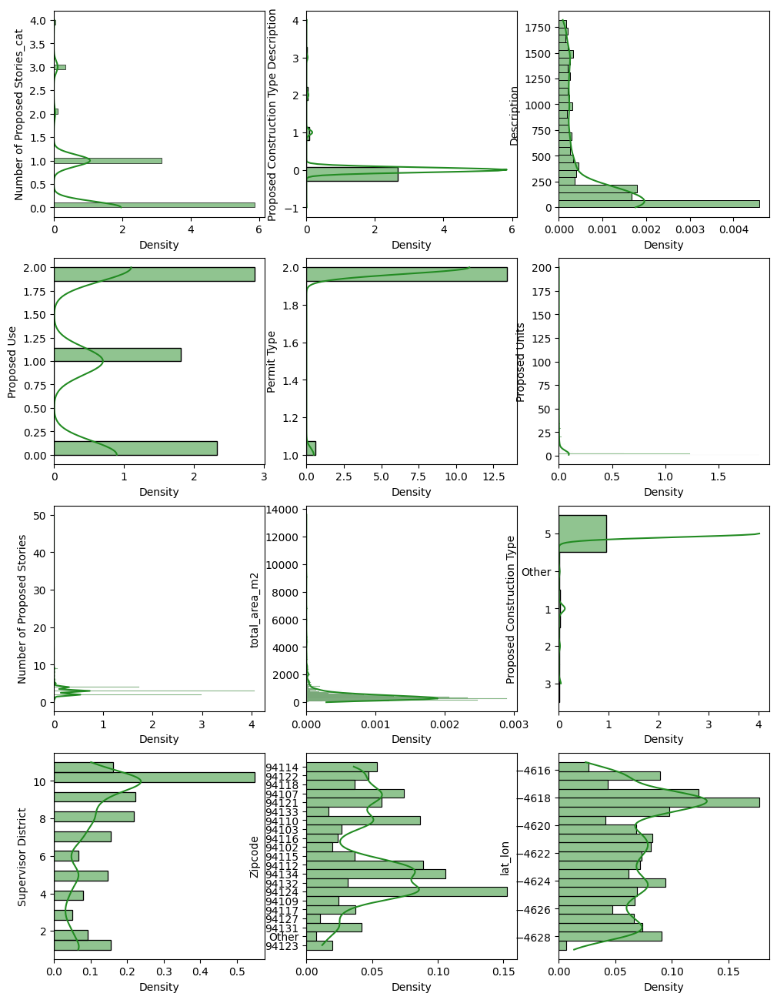

In [37]:
fig, axes = plt.subplots(nrows = 4, ncols = 3)    # axes is 2d array (3x3)
axes = axes.flatten()         # Convert axes to 1d array of length 9
fig.set_size_inches(12, 16)

for ax, col in zip(axes, newdf.columns):
    sns.histplot(data=newdf,y=col,kde=True,ax=ax,stat='density',color='forestgreen')


***Let's check the skewness of the distribution to identify possible outliers in target column***


*We will use the version 4 of database in the followings.*

/home/leo/.local/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



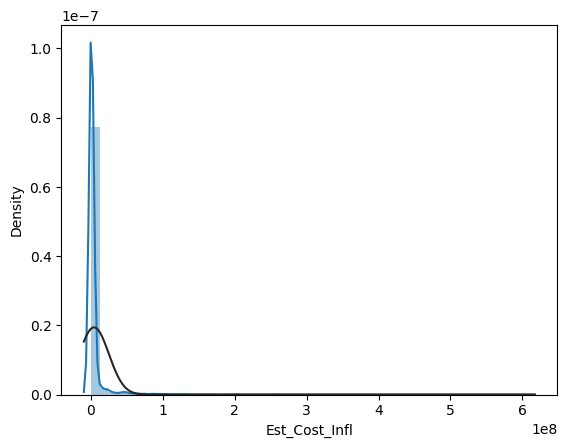

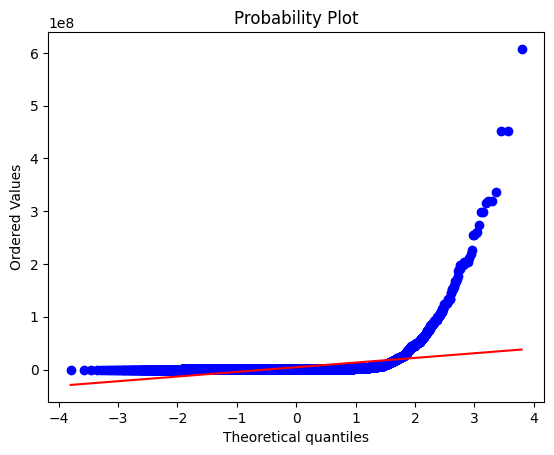

In [38]:
#histogram and normal probability plot
sns.distplot(dataset['Est_Cost_Infl'], fit=norm);
fig = plt.figure()
res = stats.probplot(dataset['Est_Cost_Infl'], plot=plt)

/home/leo/.local/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



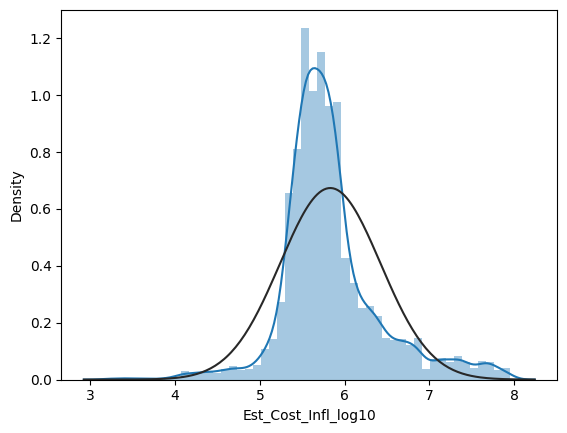

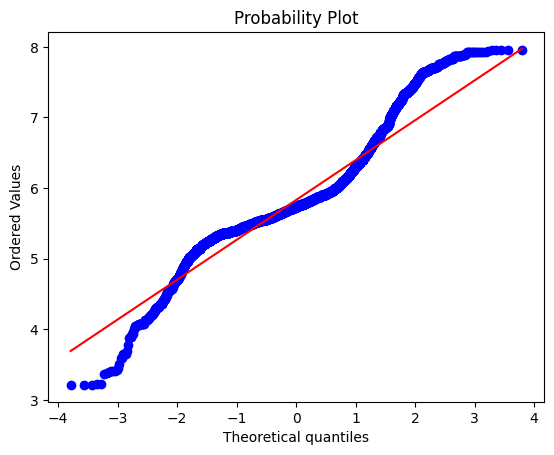

In [39]:
# log transformation of Est Cost
m_out0 = dataset['Est_Cost_Infl_log10'] < dataset['Est_Cost_Infl_log10'].quantile(.99)
m_out1 = dataset['Est_Cost_Infl_log10'] > dataset['Est_Cost_Infl_log10'].quantile(.01)

m_out = m_out0 & m_out1
#histogram and normal probability plot
sns.distplot(dataset['Est_Cost_Infl_log10'][m_out], fit=norm)
fig = plt.figure()

#note that probplot calculates quantiles for a probability plot, and shows the plot.
res = stats.probplot(dataset['Est_Cost_Infl_log10'][m_out], plot=plt)

*** Conclusion ***

We take central 98% of estimated cost data.

Log10 transformation of estimated cost results in more 'normal-distrubution' looking data so it is better.

We will also check the relationship of other variables.

/home/leo/.local/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Proposed Units', ylabel='Density'>

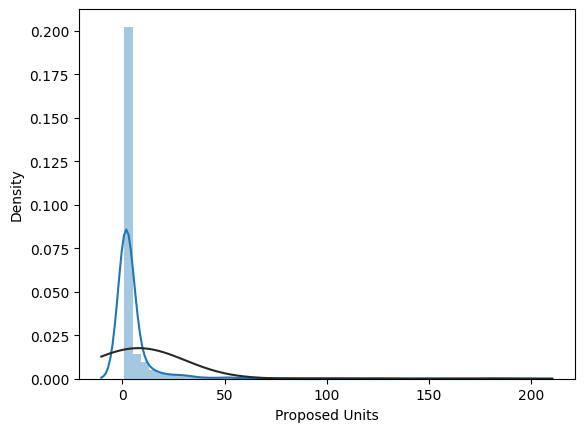

In [40]:
# log transformation of Est Cost
m_out2 = dataset['Proposed Units'] < dataset['Proposed Units'].quantile(.99)
m_out3 = dataset['Proposed Units'] > dataset['Proposed Units'].quantile(.01)
m_out = m_out0 & m_out1 & m_out2 & m_out3

#histogram and normal probability plot
vals = dataset['Proposed Units'][m_out]
sns.distplot(vals, fit=norm)

***Check outliers***



*   Within 'Proposed Units', there are few data (<1%) with 0 units!
*   Within 'Proposed Units', there are few data (<1%) above 150 units!

Let's eliminate these possible particular cases/outliers.



/home/leo/.local/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Number of Proposed Stories', ylabel='Density'>

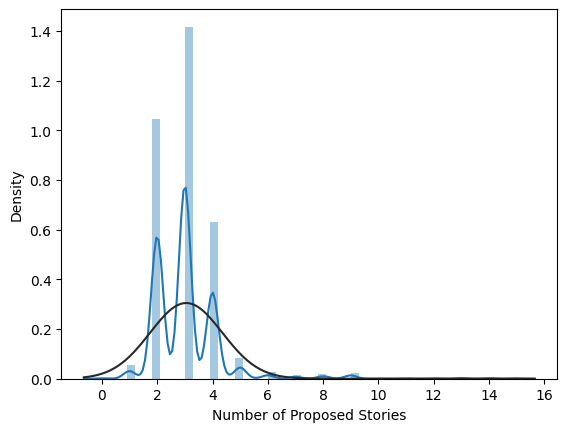

In [41]:
m_out4 = dataset['Number of Proposed Stories'] <= 15
m_out = m_out0 & m_out1 & m_out2 & m_out3 & m_out4

#histogram and normal probability plot
vals = dataset['Number of Proposed Stories'][m_out]
sns.distplot(vals, fit=norm)

*** Discussions***


*   Let's take dataset['Number of Proposed Stories'] < 15. We will limit our prediction capability up to 15 stories.


**Conclusion**

Finally, we apply the following masks on the original database from SFdata.gov:

* permit_type_mask = dataset["Permit Type"] < 3
* permit_complete_mask = dataset["Current Status"] == "complete"
* m_pu1 = dataset["Proposed Use"]=="1 family dwelling"
* m_pu2 = dataset["Proposed Use"]=="2 family dwelling"
* m_pu3 = dataset["Proposed Use"]=="apartments"
* m_out0 = dataset['Est_Cost_Infl_log10'] <= dataset['Est_Cost_Infl_log10'].quantile(0.99)
* m_out1 = dataset['Est_Cost_Infl_log10'] >= dataset['Est_Cost_Infl_log10'].quantile(0.01)
* m_out2 = dataset['Proposed Units'] <= dataset['Proposed Units'].quantile(0.99)
* m_out3 = dataset['Proposed Units'] > dataset['Proposed Units'].quantile(0.01)
* m_out4 = dataset['Number of Proposed Stories_'] <= 15

**Outliers on map**


In [42]:
print('Here is a map of data being removed from database version 4:')
lat0 , lon0 = 37.750000, -122.431000

dataset_ =  dataset.loc[~m_out,:]
fig = px.scatter_mapbox(dataset_.loc[:1566,:], lat="lon", lon="lat",
                        zoom = 11.0, center = {'lat': lat0, 'lon': lon0}, 
                        mapbox_style="stamen-toner",
                        color= 'Estimated cost in today s dollars in log10',
                        title = 'Identified outliers or particular cases',
                        hover_name = 'address',
                        hover_data = {#'Total counts': True,
                                      'Number of Proposed Stories':True,
                                      'Proposed Units':True,
                                      'Completed Year':True,
                                      'Description':True,
                                      'Proposed Use' : True,
                                      'Cost_1M':True,
                                      'Estimated cost in today s dollars in log10':False,
                                      'lon' : False,
                                      'lat' : False,
                                      }                     
)

fig.update_layout( hovermode="closest")
fig.show()

Here is a map of data being removed from database version 4:


#Skewed features


**Let's see the skewedness of these columns**

For certain features, we observe

    deviation from the normal distribution,
    positive skewness and
    peakedness.

Therefore, we will apply boxcox1p transformation for the skewed distributions. 

We use the scipy function boxcox1p which computes the Box-Cox transformation of 1+x. Note that setting λ=0 is equivalent to log1p used above for the target variable.

Reference article: https://medium.com/@kangeugine/box-cox-transformation-ba01df7da884

In [43]:
numeric_feats = newdf.dtypes[newdf.dtypes != "object"].index
newdf_bct = newdf.loc[m_out,:]
# Check the skew of all numerical features
skewed_feats = newdf_bct[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness


Skew in numerical features: 



,Skew
Number of Proposed Stories,9.364949
total_area_m2,8.852962
Proposed Construction Type Description,6.216290
Proposed Units,5.947983
Number of Proposed Stories_cat,2.020197
Description,1.140932
Proposed Use,-0.131859
lat_lon,-0.183705
Supervisor District,-0.817348
Permit Type,-4.395131


In [44]:
skewness = skewness[abs(skewness) > 2.5]
print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))
from scipy.special import boxcox1p
skewed_features = skewness.index
lam = 0.10
for feat in skewness.index:
    newdf_bct[feat+'_bct'] = boxcox1p(newdf[feat], lam)
    

There are 10 skewed numerical features to Box Cox transform


/tmp/ipykernel_49303/3136439333.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_49303/3136439333.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_49303/3136439333.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_4

**Let's check out the skewness after boxcox1p transformation:**

In [45]:
numeric_feats = newdf_bct.dtypes[newdf_bct.dtypes != "object"].index

# Check the skew of all numerical features
skewed_feats = newdf_bct[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness


Skew in numerical features: 



/home/leo/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1340: RuntimeWarning:

Mean of empty slice.

/home/leo/.local/lib/python3.10/site-packages/numpy/core/_methods.py:182: RuntimeWarning:

invalid value encountered in divide

/home/leo/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning:

Mean of empty slice.

/home/leo/.local/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning:

invalid value encountered in double_scalars



,Skew
Number of Proposed Stories,9.364949
total_area_m2,8.852962
Proposed Construction Type Description,6.216290
Proposed Units,5.947983
Proposed Units_bct,2.455034
Number of Proposed Stories_cat,2.020197
Number of Proposed Stories_bct,1.312166
Description,1.140932
Number of Proposed Stories_cat_bct,1.128280
total_area_m2_bct,0.868247


**Discussion**

After trial and error, we observed that boxcox1p transformation improves the scores of linear regressor models. The scores remain same for the boosting algorithms and random forest tree.

--- END OF EXPLORATORY DATA ANALYSIS ---